In [1]:
import os
import pandas as pd
import geopandas as gpd

import sys
sys.path.insert(0, "../utils/")
import visual_utils

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

cwd = os.path.dirname(os.getcwd())
%load_ext autoreload
%autoreload 2

## Inspect Satellite Images

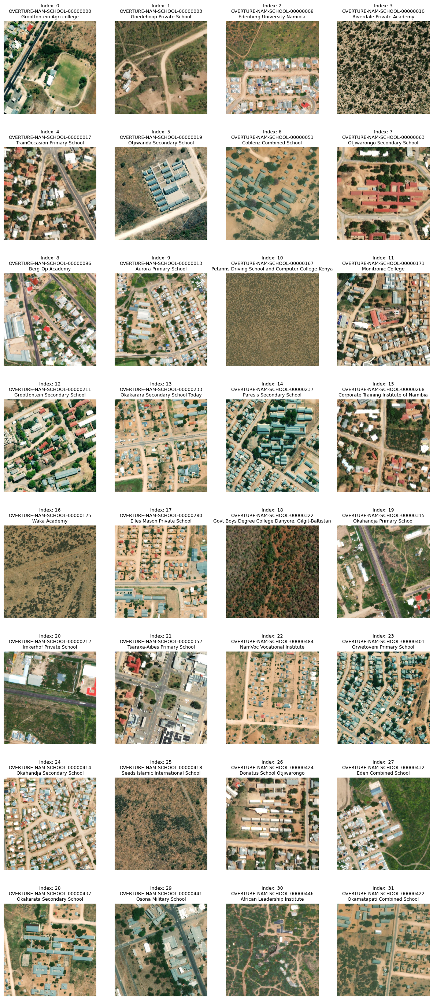

In [4]:
iso = "NAM"
visual_utils.inspect_images(iso, category="school", index=0)

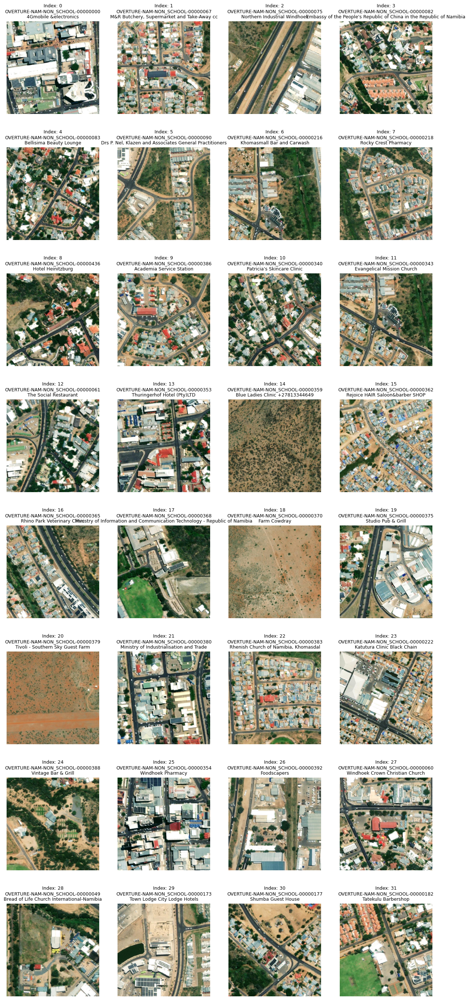

In [6]:
visual_utils.inspect_images(iso, category="non_school", index=0)

In [36]:
index = 21
visual_utils.map_coords(index, category="non_school", iso=iso)

## Google Earth Engine

In [11]:
import ee
import eeconvert as eec
import geemap as emap

ee.Authenticate() 
ee.Initialize()

Enter verification code:  4/1AfJohXnWhBETDYGAKAgIPrpgm8hV8IDkALWjPAH_jUUtCVSVxBl2m7TZmO8



Successfully saved authorization token.


In [34]:
import os
import wxee
import xarray as xr
import geopandas as gpd
import rasterio as rio

import sys
sys.path.insert(0, "../utils/")
import data_utils

iso = "NAM"
name = "clean"
category = "school"
index = 26

data_config = data_utils._load_data_config()    
cwd = os.path.dirname(os.getcwd())
    
vector_dir = data_config['data_dir']
filename =  f"{iso}_{name}.geojson"
filename = os.path.join(cwd, vector_dir, category, name, filename)

data = gpd.read_file(filename).iloc[[index]]
data = data.to_crs("EPSG:3857")
data['geometry'] = data['geometry'].centroid.buffer(500)
data = data.to_crs("EPSG:4326")
geometry = eec.gdfToFc(data) 

image = ee.Image("JRC/GHSL/P2023A/GHS_BUILT_C/2018")
image = image.select('built_characteristics').clip(geometry)
file = image.wx.to_tif(
    out_dir='./', 
    description="temp", 
    region=geometry.geometry(), 
    scale=10, 
    crs="EPSG:4326",
    progress=False
)

with rio.open(file[0], 'r') as src:
    image = src.read(1)
    image[image == -32768] = 0
    print(image.sum())

46511
